# Imports

In [43]:
import pandas as pd
import pandas_profiling
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import Image, display

# Read data with dropped non-impact parameters

In [2]:
df = pd.read_csv('../pro-test/data/Leb_1_drop_non_impact_params.csv',index_col=0,header=0)

# Initial Exploration

In [3]:
df.head()

,nameofevent,startdate,endate,ongoing,timeofprotest,governorate,district,location,gpslatend,gpslongend,...,militiarepress,partyrepress,militia or party,employerrepress,eventcancelled,cancelreason,otherrepress,killed,injured,arrested
recordnumber,,,,,,,,,,,,,,,,,,,,,
20191592,Thawra,2019-11-26,2019-11-26,0,0,Beirut,Beirut,BDL - Hamra,33.895739,35.488961,...,0,0,0,0,0,NaN,0,0,0,0
20200162,Thawra,2020-01-13,2020-01-13,0,0,North,Tripoli,Abi Samra - Tripoli,34.425973,35.842369,...,0,0,0,0,0,NaN,0,0,0,0
20191864,Al Asir detainees,2019-12-06,2019-12-06,0,0,South,Sidon,Maksar Al Abed roundabout,33.566481,35.405984,...,0,0,0,0,0,NaN,0,0,0,0
20200903,Thawra,2020-03-27,2020-03-27,0,0,South,Sidon,Eliya square,33.562139,35.379648,...,0,0,0,0,0,NaN,0,0,0,0
20200891,Thawra,2020-03-20,2020-03-20,0,0,South,Sidon,Municipality of Sidon,33.564317,35.375296,...,0,0,0,0,0,NaN,0,0,0,0


In [4]:
df.shape

(3224, 117)

## Parameters with 'object' type

In [26]:
object_types = df.select_dtypes(include=['object'])
object_types

,nameofevent,startdate,endate,timeofprotest,governorate,district,location,locationtypeend,locationtypestart,demandtypeone,...,sector,industryfirst,industrysecond,tacticprimary,tacticsecondary,campaign,violence,propertydamage,repression,cancelreason
recordnumber,,,,,,,,,,,,,,,,,,,,,
20191592,Thawra,2019-11-26,2019-11-26,0,Beirut,Beirut,BDL - Hamra,Bank/Central Bank,NaN,Economic/Financial,...,NaN,NaN,NaN,Occupation / sit-in,NaN,NaN,None,None,"No known coercion, no security presence",NaN
20200162,Thawra,2020-01-13,2020-01-13,0,North,Tripoli,Abi Samra - Tripoli,Main road,NaN,Thawra 2019,...,NaN,NaN,NaN,Demonstration / protest,NaN,NaN,None,None,"No known coercion, no security presence",NaN
20191864,Al Asir detainees,2019-12-06,2019-12-06,0,South,Sidon,Maksar Al Abed roundabout,Midan/Square,NaN,Human rights / civic freedoms,...,NaN,NaN,NaN,Demonstration / protest,NaN,NaN,None,None,"No known coercion, no security presence",NaN
20200903,Thawra,2020-03-27,2020-03-27,0,South,Sidon,Eliya square,Midan/Square,NaN,Human rights / civic freedoms,...,NaN,NaN,NaN,Occupation / sit-in,NaN,NaN,None,None,"No known coercion, no security presence",NaN
20200891,Thawra,2020-03-20,2020-03-20,0,South,Sidon,Municipality of Sidon,Government building,NaN,Human rights / civic freedoms,...,NaN,NaN,NaN,Occupation / sit-in,NaN,NaN,None,None,"No known coercion, no security presence",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20200311,Thawra,2020-01-16,2020-01-16,0,Beirut,Beirut,Badaro - Ministry of Social Affairs,Government building,NaN,Labor,...,NaN,NaN,NaN,Occupation / sit-in,NaN,NaN,None,None,"No known coercion, no security presence",NaN
20192258,Thawra,2019-12-24,2019-12-24,0,South,Tyre,BDL Tyre,Bank/Central Bank,NaN,Economic/Financial,...,NaN,NaN,NaN,Occupation / sit-in,NaN,NaN,None,None,Army present at event,NaN
20191013,Thawra,2019-11-10,2019-11-10,0,Baalbeck-Hermel,Baalbeck,Baalbek City - infront of Baalbek Temple,Midan/Square,NaN,Thawra 2019,...,NaN,NaN,NaN,March,NaN,NaN,None,None,"No known coercion, no security presence",NaN


## Parameters with 'int64' type

In [29]:
int_types = df.select_dtypes(include=['int64'])
int_types

,ongoing,Future Movement,Federation of Popular Leagues and Committes,Islamic Charitable Projects (Al Ahbash),Arab Liberation Party,Akkar Popular Assembly,Union of Muslim Ulama,Ahmad Al Assir,Islamic Group,Islamic Labour Front,...,milrepress,militiarepress,partyrepress,militia or party,employerrepress,eventcancelled,otherrepress,killed,injured,arrested
recordnumber,,,,,,,,,,,,,,,,,,,,,
20191592,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
20200162,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
20191864,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
20200903,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
20200891,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20200311,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
20192258,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
20191013,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Parameters with 'float64' type

In [30]:
float_types = df.select_dtypes(include=['float64'])
float_types

,gpslatend,gpslongend,gpslatstart,gpslongstart,sizeexact,sizeestimate,Alawite Youth Movement,Socialist Forum
recordnumber,,,,,,,,
20191592,33.895739,35.488961,NaN,NaN,NaN,31.0,0.0,0.0
20200162,34.425973,35.842369,NaN,NaN,NaN,-99.0,0.0,0.0
20191864,33.566481,35.405984,NaN,NaN,NaN,3.0,0.0,0.0
20200903,33.562139,35.379648,NaN,NaN,NaN,-99.0,0.0,0.0
20200891,33.564317,35.375296,NaN,NaN,NaN,-99.0,0.0,0.0
...,...,...,...,...,...,...,...,...
20200311,33.877324,35.517439,NaN,NaN,NaN,31.0,0.0,0.0
20192258,33.271677,35.200006,NaN,NaN,NaN,3.0,0.0,0.0
20191013,34.005364,36.211040,NaN,NaN,NaN,31.0,0.0,0.0


In [7]:
df.dtypes.sort_values(ascending=False).head(30)

nameofevent           object
demandother           object
slogans               object
organizer             object
orgtypefirst          object
orgtypesecond         object
cancelreason          object
startdate             object
repression            object
propertydamage        object
violence              object
campaign              object
tacticsecondary       object
tacticprimary         object
industrysecond        object
industryfirst         object
sector                object
modified_demands      object
participantother      object
demandtypetwo         object
timeofprotest         object
locationtypeend       object
demandtypeone         object
location              object
district              object
governorate           object
endate                object
locationtypestart     object
gpslongstart         float64
gpslatend            float64
dtype: object

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3224 entries, 20191592 to 20191011
Columns: 117 entries, nameofevent to arrested
dtypes: float64(8), int64(81), object(28)
memory usage: 2.9+ MB


In [9]:
df.describe()

,ongoing,gpslatend,gpslongend,gpslatstart,gpslongstart,sizeexact,sizeestimate,Future Movement,Federation of Popular Leagues and Committes,Islamic Charitable Projects (Al Ahbash),...,milrepress,militiarepress,partyrepress,militia or party,employerrepress,eventcancelled,otherrepress,killed,injured,arrested
count,3224.000000,3224.000000,3224.000000,59.000000,59.000000,17.000000,3208.000000,3224.000000,3224.0,3224.0,...,3224.000000,3224.000000,3224.000000,3224.000000,3224.000000,3224.000000,3224.000000,3224.000000,3224.000000,3224.000000
mean,0.001861,33.618634,35.304158,33.801395,35.549409,216.176471,15.863778,0.004963,0.0,0.0,...,0.080335,0.008995,0.005273,0.012717,0.001241,0.001861,0.001241,0.000931,0.305831,0.065136
std,0.043106,3.592124,3.769763,0.312927,0.160308,263.873605,634.747571,0.070283,0.0,0.0,...,0.271853,0.094429,0.072435,0.112068,0.035207,0.043106,0.035207,0.030495,7.795646,1.230787
min,0.000000,0.000000,0.000000,33.243429,35.199818,0.000000,-99.000000,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,0.000000
25%,0.000000,33.783878,35.495195,33.551753,35.488410,40.000000,-99.000000,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,33.895496,35.639162,33.887318,35.505702,140.000000,-99.000000,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,34.418257,35.864650,33.895525,35.541588,200.000000,5.000000,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,34.632800,50.472539,34.542053,36.074700,1000.000000,30001.000000,1.000000,0.0,0.0,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,377.000000,59.000000


## Unique Values

In [10]:
df.nunique().sort_values(ascending=False).head(30)

location             1747
gpslongend           1653
gpslatend            1644
organizer             279
demandother           274
endate                164
startdate             164
participantother       84
demandtypetwo          81
nameofevent            70
gpslatstart            54
gpslongstart           53
slogans                50
locationtypeend        30
timeofprotest          30
district               28
injured                17
orgtypefirst           16
arrested               14
sizeexact              14
locationtypestart      13
tacticprimary          13
demandtypeone          13
sizeestimate           12
tacticsecondary        11
governorate             9
orgtypesecond           9
repression              8
industryfirst           6
cancelreason            6
dtype: int64

### Number of unique values for target 'repression'

In [60]:
df['repression'].nunique()

8

## Get percentage of missing entries for each parameter

In [11]:
number_of_oberservations = df.shape[0]
number_of_oberservations

3224

In [12]:
df.isnull().sum().sort_values(ascending=False).head(20)/number_of_oberservations

industrysecond            0.999690
campaign                  0.999690
cancelreason              0.997829
sector                    0.997208
industryfirst             0.997208
sizeexact                 0.994727
orgtypesecond             0.991625
gpslongstart              0.981700
locationtypestart         0.981700
gpslatstart               0.981700
slogans                   0.977047
tacticsecondary           0.918734
participantother          0.895782
organizer                 0.797146
orgtypefirst              0.797146
demandother               0.511476
sizeestimate              0.004963
timeofprotest             0.000310
Socialist Forum           0.000310
Alawite Youth Movement    0.000310
dtype: float64

## Profile Report

In [14]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Heat Map of data (object based parameters dropped)

In [ ]:
non_object_types = df.select_dtypes(exclude=['object'])
non_object_types

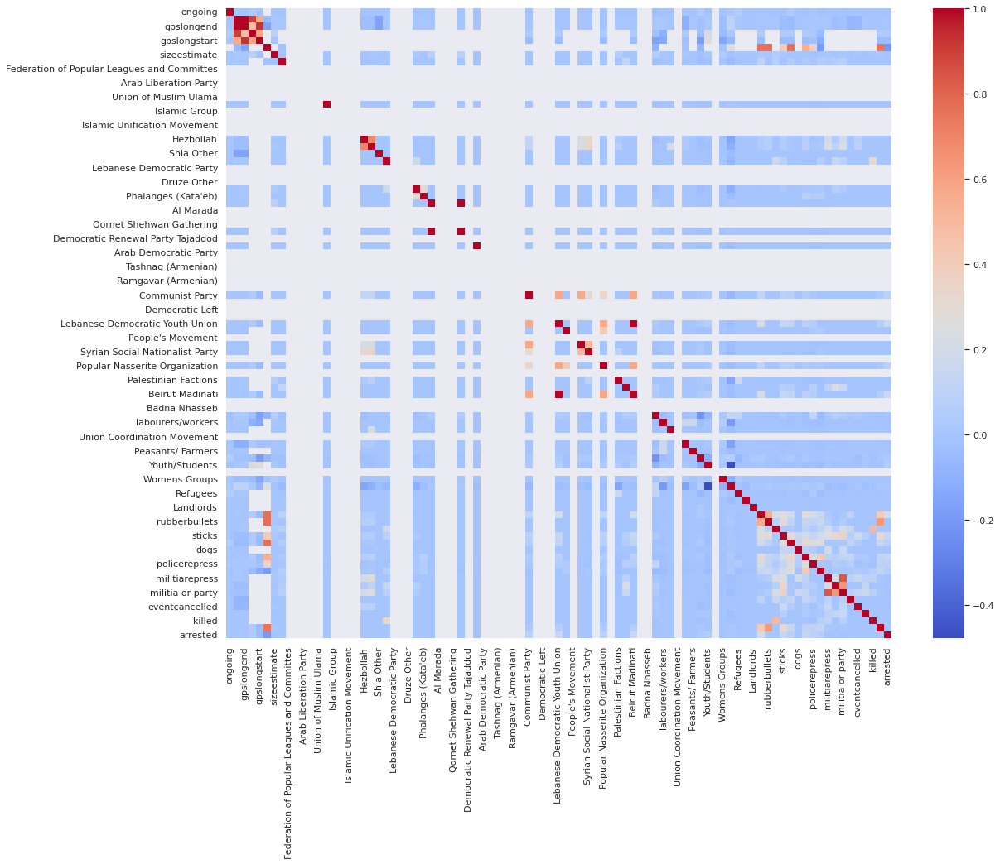

In [54]:
sns.set(rc={'figure.figsize':(18,14)})
sns.set(font_scale=1)
heatmap = sns.heatmap(data=non_object_types.corr(), cmap = "coolwarm", annot = False)
# plt.show()

fig = heatmap.get_figure()
fig.savefig("heatmap.png")

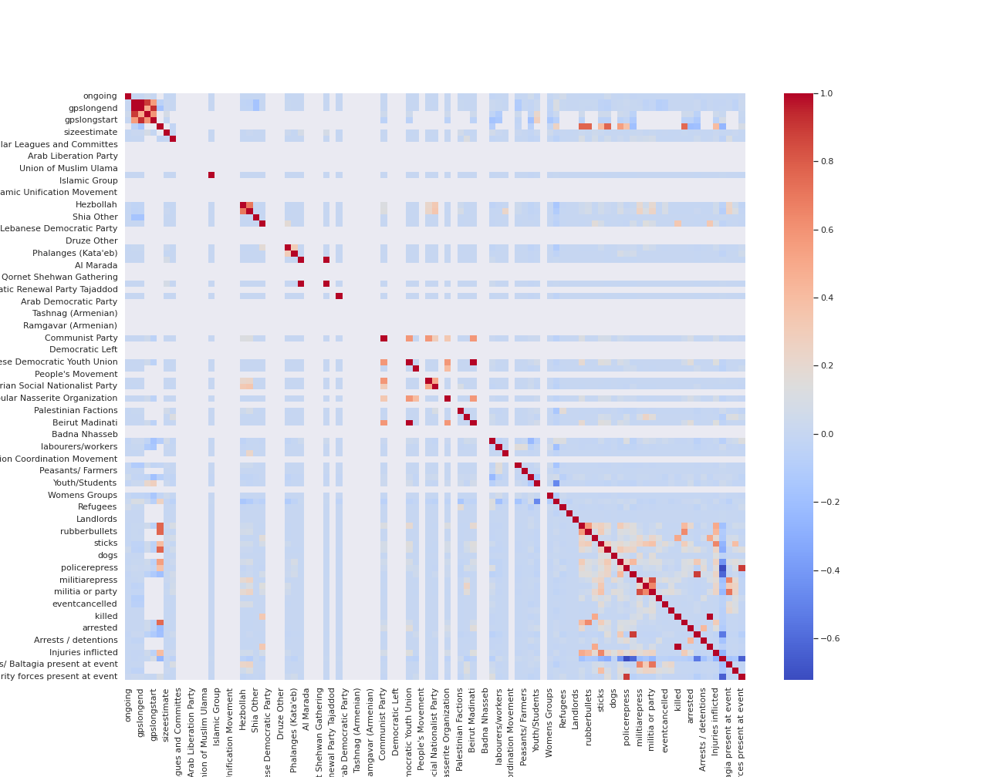

In [96]:
display(Image("heatmap.png", height=1000, width=1000, unconfined=True))

### Encode the target 'repression' and store in variable temp

In [72]:
temp = pd.get_dummies(df['repression'])

### Combine encoded target data into dataframe

In [73]:
combined = pd.concat([non_object_types,temp], axis=1)

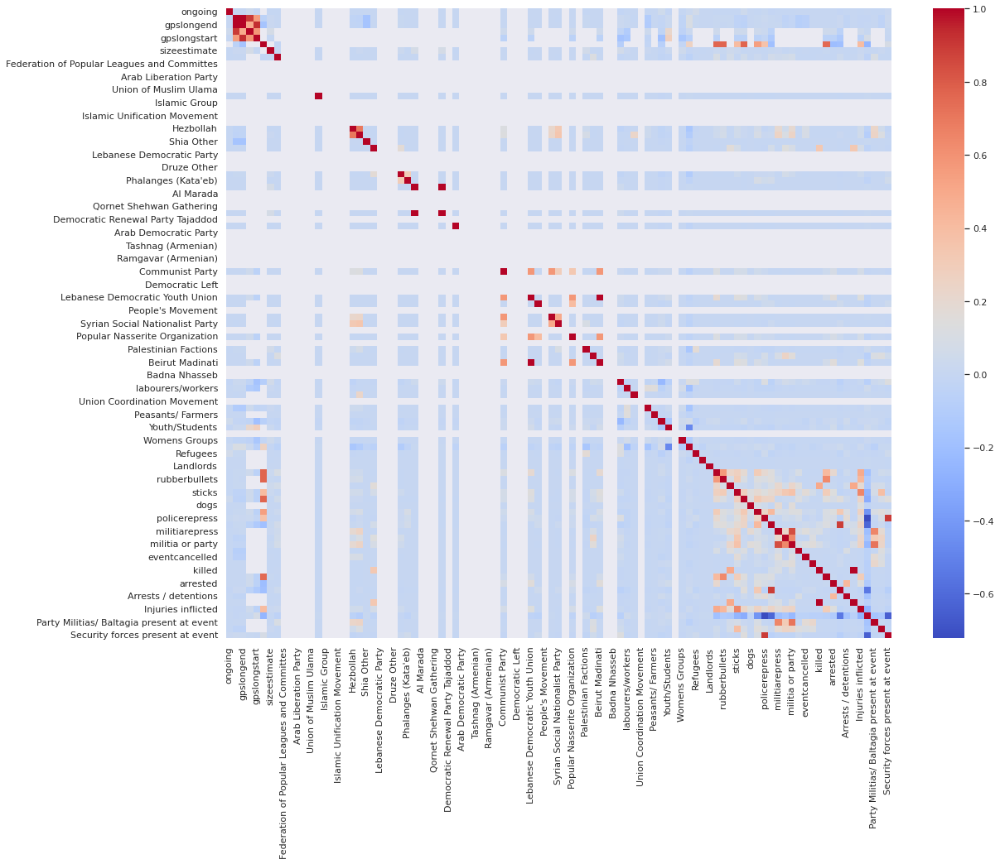

In [74]:
sns.set(rc={'figure.figsize':(18,14)})
sns.set(font_scale=1)
heatmap = sns.heatmap(data=combined.corr(), cmap = "coolwarm", annot = False)
# plt.show()

fig = heatmap.get_figure()
fig.savefig("heatmap.png")

In [75]:
temp

,Army present at event,Arrests / detentions,Deaths inflicted,Injuries inflicted,"No known coercion, no security presence",Party Militias/ Baltagia present at event,Physical harassment,Security forces present at event
recordnumber,,,,,,,,
20191592,0,0,0,0,1,0,0,0
20200162,0,0,0,0,1,0,0,0
20191864,0,0,0,0,1,0,0,0
20200903,0,0,0,0,1,0,0,0
20200891,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...
20200311,0,0,0,0,1,0,0,0
20192258,1,0,0,0,0,0,0,0
20191013,0,0,0,0,1,0,0,0


# Finding Parameters that are highly and non-highly correlated to our targets

In [77]:
target_columns = temp.columns
target_columns

Index(['Army present at event', 'Arrests / detentions', 'Deaths inflicted',
       'Injuries inflicted', 'No known coercion, no security presence',
       'Party Militias/ Baltagia present at event', 'Physical harassment',
       'Security forces present at event'],
      dtype='object')

## High Correlation Parameters to target "repression"

## Highly Correlated

In [99]:
for i in target_columns:
    print(f"{abs(round(combined.corr(),2)[i]).sort_values(ascending=False).head(20)}\n-------------------------------")

Army present at event                      1.00
milrepress                                 0.89
No known coercion, no security presence    0.55
cleararea                                  0.32
sizeexact                                  0.19
surround                                   0.15
gpslongstart                               0.12
Security forces present at event           0.08
activists                                  0.06
gpslatstart                                0.05
policerepress                              0.05
Leftist Other                              0.04
Future Movement                            0.04
labourers/workers                          0.03
sticks                                     0.03
Refugees                                   0.03
otherrepress                               0.03
Residents                                  0.03
Youth/Students                             0.03
Syrian Social Nationalist Party            0.03
Name: Army present at event, dtype: floa

## Highly Un-Correlated

In [101]:
for i in target_columns:
    print(f"{abs(round(combined.corr(),2)[i]).sort_values(ascending=True).head(50)}\n-------------------------------")

Landlords                                    0.00
Ba'ath Party                                 0.00
Peasants/ Farmers                            0.00
Lebanese Democratic Youth Union              0.00
Womens Groups                                0.00
National Block                               0.00
Christian Other                              0.00
Lebanese Forces                              0.00
Phalanges (Kata'eb)                          0.00
Tenants                                      0.00
General Confederation of Lebanese Workers    0.00
Beirut Madinati                              0.00
dogs                                         0.00
Ahmad Al Assir                               0.00
sizeestimate                                 0.00
Shia Other                                   0.00
rubberbullets                                0.01
militiarepress                               0.01
employerrepress                              0.01
killed                                       0.01


ongoing                                      0.00
sizeestimate                                 0.00
General Confederation of Lebanese Workers    0.01
Communist Party                              0.01
National Block                               0.01
Christian Other                              0.01
Lebanese Forces                              0.01
Free Patriotic Movement                      0.01
Peasants/ Farmers                            0.01
Shia Other                                   0.01
Ba'ath Party                                 0.01
Ahmad Al Assir                               0.01
Refugees                                     0.01
Tenants                                      0.01
Landlords                                    0.01
gpslatstart                                  0.01
gpslongend                                   0.01
gpslatend                                    0.01
Syrian Social Nationalist Party              0.01
Residents                                    0.02
